# 🚦 MobileNetV2 - Phân Loại Biển Báo Giao Thông (Data Tự Làm)
## Xây dựng MobileNetV2 từ đầu - Không sử dụng model có sẵn
- **Dataset:** File nén trên Google Drive, copy về `/content`, giải nén rồi train từ local Colab
- **Model:** Custom MobileNetV2 (PyTorch)
- **Input:** 224×224 pixels theo dữ liệu đã resize sẵn
- **Features:** Training log, Checkpoint, Resume training, Visualization

In [43]:
# ============================================================
# CELL 1: SETUP & CÀI ĐẶT
# ============================================================
import os, sys, time, json, csv, random, math, warnings
from pathlib import Path
import numpy as np
from PIL import Image
warnings.filterwarnings('ignore')

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

print("✅ Setup hoàn tất!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Setup hoàn tất!


In [44]:
# ============================================================
# CELL 2: LOAD DATASET TỪ GOOGLE DRIVE + GIẢI NÉN VỀ LOCAL COLAB
# ============================================================
from google.colab import drive
from pathlib import Path
import shutil, zipfile, tarfile, subprocess

# 1) Mount Google Drive
drive.mount('/content/drive')

# 2) Sửa đường dẫn này theo đúng vị trí file nén bạn upload lên Drive
DRIVE_ARCHIVE_PATH = '/content/drive/MyDrive/data_bien_bao.rar'

# 3) Copy file nén từ Drive về ổ local của Colab để đọc/giải nén nhanh hơn
archive_path = Path(DRIVE_ARCHIVE_PATH)
LOCAL_ARCHIVE_PATH = f'/content/{archive_path.name}'
EXTRACT_ROOT = Path('/content/data_bien_bao')

if not archive_path.exists():
    raise FileNotFoundError(
        f'Không tìm thấy file nén trên Drive: {DRIVE_ARCHIVE_PATH}\n'
        'Hãy sửa DRIVE_ARCHIVE_PATH cho đúng, ví dụ: /content/drive/MyDrive/folder/data.zip'
    )

print('Đang copy file nén từ Drive về local Colab...')
shutil.copy2(archive_path, LOCAL_ARCHIVE_PATH)
print(f'Đã copy xong: {LOCAL_ARCHIVE_PATH}')
print(f'Dung lượng: {Path(LOCAL_ARCHIVE_PATH).stat().st_size / (1024**3):.2f} GB')

# 4) Giải nén ở /content. Nếu runtime/session còn sống thì không cần giải nén lại.
EXTRACT_ROOT.mkdir(parents=True, exist_ok=True)
print(f'Đang giải nén vào: {EXTRACT_ROOT}')

suffixes = ''.join(Path(LOCAL_ARCHIVE_PATH).suffixes).lower()
if suffixes.endswith('.zip'):
    with zipfile.ZipFile(LOCAL_ARCHIVE_PATH, 'r') as zf:
        zf.extractall(EXTRACT_ROOT)
elif suffixes.endswith(('.tar.gz', '.tgz', '.tar')):
    with tarfile.open(LOCAL_ARCHIVE_PATH, 'r:*') as tf:
        tf.extractall(EXTRACT_ROOT)
elif suffixes.endswith('.rar'):
    print('Detected .rar file, installing unrar on Colab...')
    subprocess.run(['apt-get', '-qq', 'update'], check=True)
    subprocess.run(['apt-get', '-qq', 'install', '-y', 'unrar'], check=True)
    subprocess.run(['unrar', 'x', '-o+', LOCAL_ARCHIVE_PATH, str(EXTRACT_ROOT) + '/'], check=True)
else:
    raise ValueError('Supported archive formats: .zip, .rar, .tar, .tar.gz, .tgz')

print('Giải nén xong!')

# 5) Xem nhanh bên trong sau khi giải nén
def preview_tree(root, max_depth=3, max_items_per_dir=12):
    root = Path(root)
    print(f'\nNội dung trong {root}:')

    def walk_dir(current, depth):
        if depth > max_depth:
            return
        items = sorted(current.iterdir(), key=lambda p: (p.is_file(), p.name.lower()))
        shown = items[:max_items_per_dir]
        for item in shown:
            prefix = '  ' * depth + ('[D] ' if item.is_dir() else '[F] ')
            print(prefix + item.name)
            if item.is_dir():
                walk_dir(item, depth + 1)
        remaining = len(items) - len(shown)
        if remaining > 0:
            print('  ' * depth + f'... còn {remaining} mục nữa')

    walk_dir(root, 0)

preview_tree(EXTRACT_ROOT)

# 6) Tu tim thu muc dataset that su sau khi giai nen.
# Uu tien SplitData vi theo tai lieu day la data cuoi dung de train.
# Ho tro cac cau truc pho bien:
#   SplitData/train/<class>/*.jpg + SplitData/val + SplitData/test
#   data/train/<class>/*.jpg va data/test/<class>/*.jpg
#   hoac data/<class>/*.jpg
IMAGE_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.webp'}

def count_images(folder):
    return sum(1 for p in Path(folder).rglob('*') if p.suffix.lower() in IMAGE_EXTS)

def has_class_subfolders(folder):
    folder = Path(folder)
    return any(p.is_dir() and count_images(p) > 0 for p in folder.iterdir())

def has_train_split(folder):
    folder = Path(folder)
    lower_children = {p.name.lower(): p for p in folder.iterdir() if p.is_dir()}
    return 'train' in lower_children and has_class_subfolders(lower_children['train'])

candidates = [EXTRACT_ROOT] + [p for p in EXTRACT_ROOT.rglob('*') if p.is_dir()]
DATA_DIR = None

# Priority 1: SplitData/train/val/test
for cand in candidates:
    if cand.name.lower() in {'splitdata', 'split_data', 'split-data'} and has_train_split(cand):
        DATA_DIR = cand
        break

# Priority 2: any folder that already has train/<class>/*.jpg
if DATA_DIR is None:
    for cand in candidates:
        if has_train_split(cand):
            DATA_DIR = cand
            break

# Priority 3: direct class-folder dataset, e.g. data/<class>/*.jpg
if DATA_DIR is None:
    ignored_stage_names = {'datafinal', 'code', 'metadata', 'filterdata', 'cropdata', 'resizedata', 'rgbdata'}
    for cand in candidates:
        if cand.name.lower() in ignored_stage_names:
            continue
        if has_class_subfolders(cand):
            DATA_DIR = cand
            break

if DATA_DIR is None:
    raise RuntimeError(
        'Khong tim thay cau truc dataset dang folder class.\n'
        'Cau truc nen la SplitData/train/<ten_lop>/anh.jpg hoac data/<ten_lop>/anh.jpg'
    )

print(f'\nDATA_DIR duoc dung cho training: {DATA_DIR}')
print(f'Tong so anh tim thay: {count_images(DATA_DIR):,}')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Đang copy file nén từ Drive về local Colab...
Đã copy xong: /content/data_bien_bao.rar
Dung lượng: 1.80 GB
Đang giải nén vào: /content/data_bien_bao
Detected .rar file, installing unrar on Colab...
Giải nén xong!

Nội dung trong /content/data_bien_bao:
[D] data_bien_bao
  [D] Code
    [D] __pycache__
      [F] augment_images.cpython-310.pyc
      [F] normalize_images.cpython-310.pyc
      [F] split_dataset.cpython-310.pyc
    [F] augment_images.py
    [F] config.json
    [F] convert_rgb.py
    [F] resize_images.py
    [F] split_dataset.py
  [D] DataFinal
    [D] CropData
      [D] no_entry
      [D] no_stopping
      [D] no_vehicles
      [D] parking
      [D] priority_road
      [D] roadworks
      [D] roundabout
      [D] speed_limit_30
      [D] speed_limit_40
      [D] speed_limit_50
      [D] speed_limit_60
      [D] stop_sign
    [D] Data
      [D] no_e

In [45]:
# ============================================================
# CELL 3: CẤU HÌNH HYPERPARAMETERS
# ============================================================
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['figure.figsize'] = (12, 6)
matplotlib.rcParams['font.size'] = 12

CONFIG = {
    'img_size': 224,
    'resize_enabled': 0,    # 1 = resize in Colab | 0 = keep prepared image size
    'resize_size': 224,      # model input size; if resize_enabled=0, set this to current image size
    'augment_enabled': 1,    # 1 = augment online while training | 0 = no online augment
    'batch_size': 8,
    'epochs': 10,
    'lr': 0.01,
    'momentum': 0.9,
    'weight_decay': 1e-4,
    'num_classes': 43,
    'width_mult': 1.0,
    'warmup_epochs': 5,
    'label_smoothing': 0.1,
    'dropout': 0.2,
    'grad_clip': 5.0,
    'patience': 10,
    'save_every': 10,
    'seed': 42,
    'resume': False,  # True = tiếp tục train từ checkpoint | False = train lại từ đầu
    'checkpoint_dir': '/content/drive/MyDrive/mobilenetv2_gtsrb_v3/checkpoints/',
    'log_dir': '/content/drive/MyDrive/mobilenetv2_gtsrb_v3/logs/',
}

# Tạo thư mục
os.makedirs(CONFIG['checkpoint_dir'], exist_ok=True)
os.makedirs(CONFIG['log_dir'], exist_ok=True)

# Device & Seed
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(CONFIG['seed'])
np.random.seed(CONFIG['seed'])
random.seed(CONFIG['seed'])
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(CONFIG['seed'])
    torch.backends.cudnn.deterministic = True

print(f"🖥️ Device: {device}")
if torch.cuda.is_available():
    print(f"🎮 GPU: {torch.cuda.get_device_name(0)}")
print(f"📋 Config: {json.dumps(CONFIG, indent=2)}")

🖥️ Device: cuda
🎮 GPU: Tesla T4
📋 Config: {
  "img_size": 224,
  "resize_enabled": 0,
  "resize_size": 224,
  "augment_enabled": 1,
  "batch_size": 8,
  "epochs": 10,
  "lr": 0.01,
  "momentum": 0.9,
  "weight_decay": 0.0001,
  "num_classes": 43,
  "width_mult": 1.0,
  "warmup_epochs": 5,
  "label_smoothing": 0.1,
  "dropout": 0.2,
  "grad_clip": 5.0,
  "patience": 10,
  "save_every": 10,
  "seed": 42,
  "resume": false,
  "checkpoint_dir": "/content/drive/MyDrive/mobilenetv2_gtsrb_v3/checkpoints/",
  "log_dir": "/content/drive/MyDrive/mobilenetv2_gtsrb_v3/logs/"
}


In [46]:
# ============================================================
# CELL 4: DATA LOADING, NORMALIZE & AUGMENTATION
# ============================================================
from collections import Counter
from pathlib import Path
from torch.utils.data import random_split, Subset
from torchvision.datasets import ImageFolder

IMG_SIZE = CONFIG.get('resize_size', CONFIG['img_size'])
RESIZE_ENABLED = bool(CONFIG.get('resize_enabled', 1))
DATA_DIR = Path(DATA_DIR)

def maybe_resize(size, extra_pixels=0):
    if not RESIZE_ENABLED:
        return []
    target = size + extra_pixels
    return [transforms.Resize((target, target))]

def find_split_dir(root, split_name):
    for child in root.iterdir():
        if child.is_dir() and child.name.lower() == split_name:
            return child
    return None

train_dir = find_split_dir(DATA_DIR, 'train')
val_dir = find_split_dir(DATA_DIR, 'val') or find_split_dir(DATA_DIR, 'valid') or find_split_dir(DATA_DIR, 'validation')
test_dir = find_split_dir(DATA_DIR, 'test')

# Dataset structure supported:
#   DATA_DIR/train/<class>/*.jpg + optional val/test
#   or DATA_DIR/<class>/*.jpg, then notebook splits 70/15/15.
TRAIN_SOURCE_DIR = train_dir if train_dir is not None else DATA_DIR
raw_train_for_classes = ImageFolder(TRAIN_SOURCE_DIR)
CLASS_NAMES = raw_train_for_classes.classes
CONFIG['num_classes'] = len(CLASS_NAMES)
NUM_CLASSES = CONFIG['num_classes']

# Compute mean/std from train images only. This is the normalize step before train.
# To keep the first run reasonable on Colab, sample at most 3000 train images.
MEAN_STD_MAX_IMAGES = 3000
stats_transform = transforms.Compose(
    maybe_resize(IMG_SIZE) + [
        transforms.ToTensor(),
    ]
)
stats_dataset = ImageFolder(TRAIN_SOURCE_DIR, transform=stats_transform)
if len(stats_dataset) > MEAN_STD_MAX_IMAGES:
    generator = torch.Generator().manual_seed(CONFIG['seed'])
    stats_indices = torch.randperm(len(stats_dataset), generator=generator)[:MEAN_STD_MAX_IMAGES].tolist()
    stats_dataset = Subset(stats_dataset, stats_indices)

stats_loader = DataLoader(stats_dataset, batch_size=CONFIG['batch_size'], shuffle=False, num_workers=2)
channel_sum = torch.zeros(3)
channel_sq_sum = torch.zeros(3)
pixel_count = 0

for images, _ in stats_loader:
    channel_sum += images.sum(dim=[0, 2, 3])
    channel_sq_sum += (images ** 2).sum(dim=[0, 2, 3])
    pixel_count += images.size(0) * images.size(2) * images.size(3)

MEAN = (channel_sum / pixel_count).tolist()
STD = torch.sqrt(channel_sq_sum / pixel_count - torch.tensor(MEAN) ** 2).tolist()

# Augment is used only for train. Val/test only optional resize + normalize.
# SplitData/train already contains generated augment images, so default is off.
AUGMENT_ENABLED = bool(CONFIG.get('augment_enabled', 0))

if AUGMENT_ENABLED:
    base_augment_steps = (
        maybe_resize(IMG_SIZE, extra_pixels=8) + [
            transforms.RandomCrop((IMG_SIZE, IMG_SIZE)),
            transforms.RandomRotation(20),
            transforms.RandomAffine(degrees=0, translate=(0.15, 0.15), scale=(0.8, 1.2), shear=10),
            transforms.RandomPerspective(distortion_scale=0.3, p=0.5),
            transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.1),
            transforms.RandomGrayscale(p=0.05),
            transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 2.0)),
            transforms.ToTensor(),
            transforms.RandomErasing(p=0.2, scale=(0.02, 0.15)),
        ]
    )
else:
    base_augment_steps = (
        maybe_resize(IMG_SIZE) + [
            transforms.ToTensor(),
        ]
    )

augment_preview_transform = transforms.Compose(base_augment_steps)
train_transform = transforms.Compose(base_augment_steps + [transforms.Normalize(MEAN, STD)])
val_transform = transforms.Compose(
    maybe_resize(IMG_SIZE) + [
        transforms.ToTensor(),
        transforms.Normalize(MEAN, STD),
    ]
)

if train_dir is not None:
    train_full = ImageFolder(train_dir, transform=train_transform)
    train_full_no_aug = ImageFolder(train_dir, transform=val_transform)

    if val_dir is not None:
        val_dataset = ImageFolder(val_dir, transform=val_transform)
        train_dataset = train_full
    else:
        val_size = int(0.15 * len(train_full))
        train_size = len(train_full) - val_size
        train_dataset, val_indices = random_split(
            train_full,
            [train_size, val_size],
            generator=torch.Generator().manual_seed(CONFIG['seed'])
        )
        val_dataset = Subset(train_full_no_aug, val_indices.indices)

    if test_dir is not None:
        test_dataset = ImageFolder(test_dir, transform=val_transform)
    else:
        test_dataset = val_dataset
        print('Khong thay thu muc test, tam dung val_dataset de danh gia test.')
else:
    full_aug = ImageFolder(DATA_DIR, transform=train_transform)
    full_no_aug = ImageFolder(DATA_DIR, transform=val_transform)

    train_size = int(0.70 * len(full_aug))
    val_size = int(0.15 * len(full_aug))
    test_size = len(full_aug) - train_size - val_size
    train_dataset, val_indices, test_indices = random_split(
        full_aug,
        [train_size, val_size, test_size],
        generator=torch.Generator().manual_seed(CONFIG['seed'])
    )
    val_dataset = Subset(full_no_aug, val_indices.indices)
    test_dataset = Subset(full_no_aug, test_indices.indices)
    train_full = full_aug

train_loader = DataLoader(train_dataset, batch_size=CONFIG['batch_size'],
                          shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=CONFIG['batch_size'],
                        shuffle=False, num_workers=2, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=CONFIG['batch_size'],
                         shuffle=False, num_workers=2, pin_memory=True)

print(f"\nDataset Statistics:")
print(f"  DATA_DIR: {DATA_DIR}")
print(f"  Train source for normalize: {TRAIN_SOURCE_DIR}")
print(f"  Classes: {NUM_CLASSES}")
print(f"  Train: {len(train_dataset)} images")
print(f"  Val:   {len(val_dataset)} images")
print(f"  Test:  {len(test_dataset)} images")
print(f"  Resize enabled: {int(RESIZE_ENABLED)}")
print(f"  Input/resize size: {IMG_SIZE}x{IMG_SIZE}")
print(f"  Batch size: {CONFIG['batch_size']}")
print(f"  MEAN: {[round(x, 4) for x in MEAN]}")
print(f"  STD:  {[round(x, 4) for x in STD]}")
print("\nClass mapping:")
for idx, name in enumerate(CLASS_NAMES):
    print(f"  {idx:2d}: {name}")
print(f"\nOnline augmentation enabled: {int(AUGMENT_ENABLED)}")
print("Val/test are never augmented.")


Dataset Statistics:
  DATA_DIR: /content/data_bien_bao/Hãy Đọc Word Trước Khi Làm/DataFinal/SplitData
  Train source for normalize: /content/data_bien_bao/Hãy Đọc Word Trước Khi Làm/DataFinal/SplitData/train
  Classes: 12
  Train: 42866 images
  Val:   1839 images
  Test:  1835 images
  Resize enabled: 0
  Input/resize size: 224x224
  Batch size: 8
  MEAN: [0.5621, 0.4663, 0.5044]
  STD:  [0.3023, 0.2936, 0.3165]

Class mapping:
   0: no_entry
   1: no_stopping
   2: no_vehicles
   3: parking
   4: priority_road
   5: roadworks
   6: roundabout
   7: speed_limit_30
   8: speed_limit_40
   9: speed_limit_50
  10: speed_limit_60
  11: stop_sign

Online augmentation enabled: 1
Val/test are never augmented.


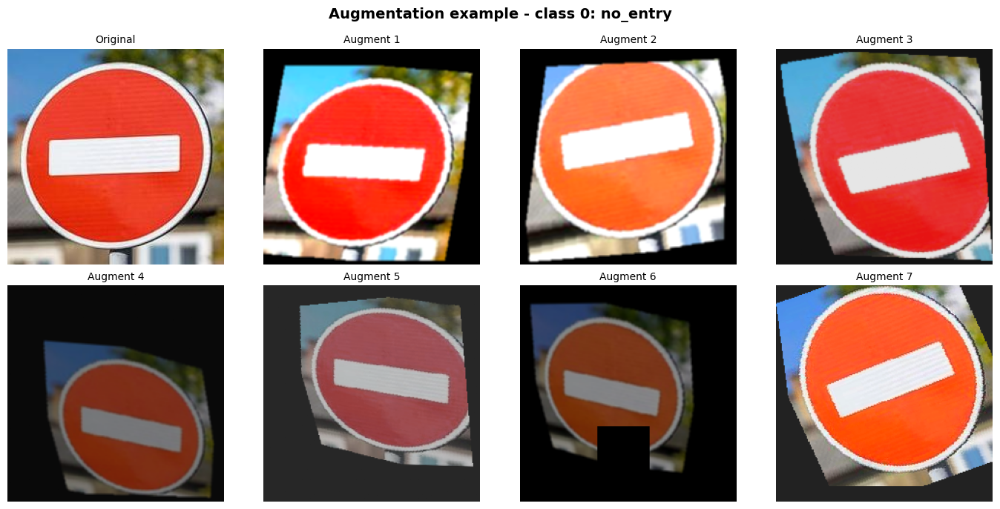

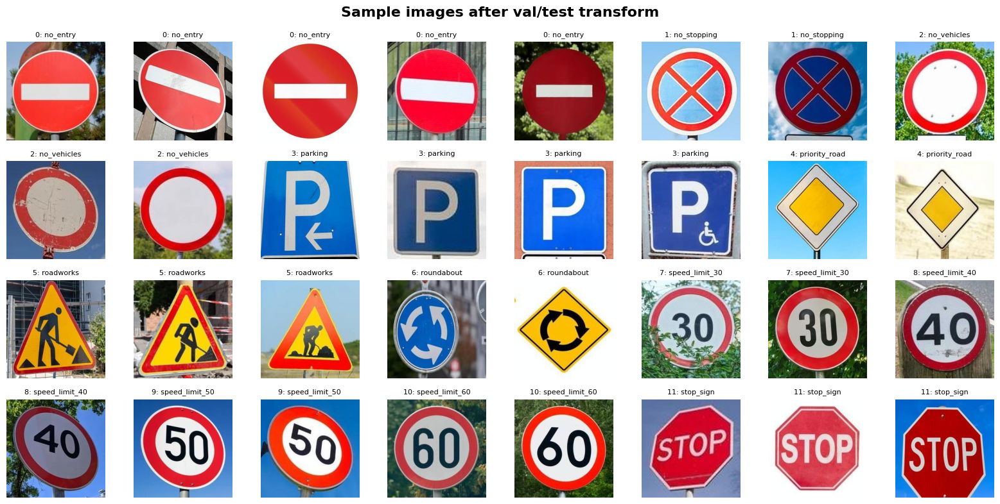

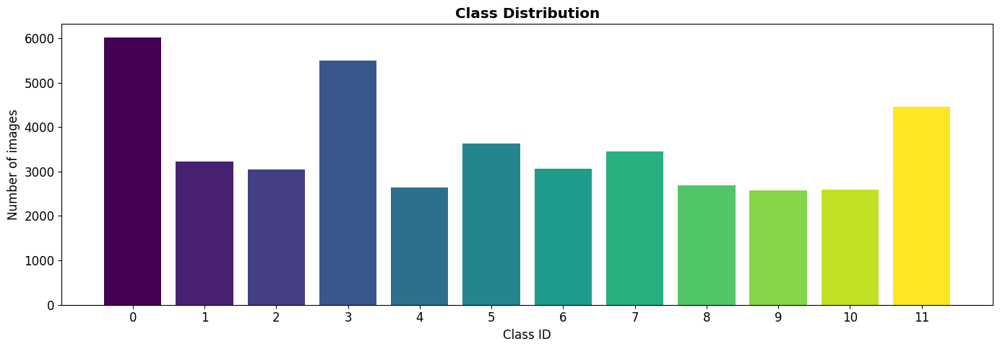

Min samples: Class 9 = 2573
Max samples: Class 0 = 6018


In [47]:
# ============================================================
# CELL 5: VISUALIZE DATA & AUGMENTATION EXAMPLE
# ============================================================
# Show 1 original train image and several random augmentation variants.
preview_raw_dataset = ImageFolder(TRAIN_SOURCE_DIR, transform=None)
preview_img, preview_label = preview_raw_dataset[0]

fig, axes = plt.subplots(2, 4, figsize=(14, 7))
fig.suptitle(f'Augmentation example - class {preview_label}: {CLASS_NAMES[preview_label]}', fontsize=14, fontweight='bold')

axes = axes.flat
axes[0].imshow(preview_img)
axes[0].set_title('Original', fontsize=10)
axes[0].axis('off')

for i in range(1, 8):
    aug_img = augment_preview_transform(preview_img).permute(1, 2, 0).clamp(0, 1)
    axes[i].imshow(aug_img)
    axes[i].set_title(f'Augment {i}', fontsize=10)
    axes[i].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(CONFIG['log_dir'], 'augmentation_preview.png'), dpi=150, bbox_inches='tight')
plt.show()

# Show normalized dataset samples after inverse-normalize for visualization.
fig, axes = plt.subplots(4, 8, figsize=(16, 8))
fig.suptitle('Sample images after val/test transform', fontsize=16, fontweight='bold')

inv_normalize = transforms.Compose([
    transforms.Normalize(mean=[-m/s for m, s in zip(MEAN, STD)],
                         std=[1/s for s in STD])
])

for i, ax in enumerate(axes.flat):
    if i < len(test_dataset):
        idx = min(i * max(1, len(test_dataset) // 32), len(test_dataset) - 1)
        img, label = test_dataset[idx]
        img = inv_normalize(img).permute(1, 2, 0).clamp(0, 1)
        ax.imshow(img)
        ax.set_title(f'{label}: {CLASS_NAMES[label]}', fontsize=8)
    ax.axis('off')
plt.tight_layout()
plt.savefig(os.path.join(CONFIG['log_dir'], 'sample_images.png'), dpi=150, bbox_inches='tight')
plt.show()

# Class distribution from the full train source.
if hasattr(train_full, 'targets'):
    all_train_labels = train_full.targets
else:
    all_train_labels = [train_full[i][1] for i in range(len(train_full))]

label_counts = Counter(all_train_labels)
fig, ax = plt.subplots(figsize=(14, 5))
bars = ax.bar(range(NUM_CLASSES), [label_counts.get(i, 0) for i in range(NUM_CLASSES)],
              color=plt.cm.viridis(np.linspace(0, 1, NUM_CLASSES)))
ax.set_xlabel('Class ID')
ax.set_ylabel('Number of images')
ax.set_title('Class Distribution', fontweight='bold')
ax.set_xticks(range(NUM_CLASSES))
plt.xticks(rotation=90 if NUM_CLASSES > 20 else 0)
plt.tight_layout()
plt.savefig(os.path.join(CONFIG['log_dir'], 'class_distribution.png'), dpi=150, bbox_inches='tight')
plt.show()
print(f"Min samples: Class {min(label_counts, key=label_counts.get)} = {min(label_counts.values())}")
print(f"Max samples: Class {max(label_counts, key=label_counts.get)} = {max(label_counts.values())}")

## 🏗️ Kiến Trúc MobileNetV2 - Custom Implementation
### Inverted Residual Block: Expand (1×1) → Depthwise (3×3) → Project (1×1, Linear)
### Activation: ReLU6 | Skip Connection khi stride=1 và in_channels == out_channels

In [48]:
# ============================================================
# CELL 6: MOBILENETV2 - XÂY DỰNG TỪ ĐẦU
# ============================================================

def _make_divisible(v, divisor=8, min_value=None):
    """Đảm bảo channels chia hết cho divisor (tối ưu phần cứng)"""
    if min_value is None:
        min_value = divisor
    new_v = max(min_value, int(v + divisor / 2) // divisor * divisor)
    if new_v < 0.9 * v:
        new_v += divisor
    return new_v


class ConvBNReLU6(nn.Sequential):
    """Conv2d + BatchNorm2d + ReLU6"""
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, groups=1):
        padding = (kernel_size - 1) // 2
        super().__init__(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding,
                      groups=groups, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU6(inplace=True)
        )


class InvertedResidual(nn.Module):
    """
    Inverted Residual Block - Core building block của MobileNetV2

    Cấu trúc: Narrow → Wide → Narrow
    1. Expansion: 1×1 Conv (mở rộng channels) + BN + ReLU6
    2. Depthwise: 3×3 Conv (groups=channels) + BN + ReLU6
    3. Projection: 1×1 Conv (thu nhỏ channels) + BN (LINEAR - không ReLU!)

    Skip connection: chỉ khi stride=1 VÀ in_channels == out_channels
    """
    def __init__(self, in_channels, out_channels, stride, expand_ratio):
        super().__init__()
        self.stride = stride
        assert stride in [1, 2]

        hidden_dim = int(round(in_channels * expand_ratio))
        self.use_skip = (stride == 1 and in_channels == out_channels)

        layers = []
        # 1. Expansion layer (skip nếu expand_ratio = 1)
        if expand_ratio != 1:
            layers.append(ConvBNReLU6(in_channels, hidden_dim, kernel_size=1))

        # 2. Depthwise convolution
        layers.append(ConvBNReLU6(hidden_dim, hidden_dim, kernel_size=3,
                                   stride=stride, groups=hidden_dim))

        # 3. Projection layer (LINEAR - không có ReLU!)
        layers.extend([
            nn.Conv2d(hidden_dim, out_channels, 1, 1, 0, bias=False),
            nn.BatchNorm2d(out_channels),
        ])

        self.conv = nn.Sequential(*layers)

    def forward(self, x):
        if self.use_skip:
            return x + self.conv(x)  # Skip connection
        else:
            return self.conv(x)


class MobileNetV2(nn.Module):
    """
    MobileNetV2 - Xây dựng từ đầu

    Architecture Table (theo paper gốc):
    | t | c   | n | s |
    |---|-----|---|---|
    | 1 | 16  | 1 | 1 |  (bottleneck)
    | 6 | 24  | 2 | 2 |
    | 6 | 32  | 3 | 2 |
    | 6 | 64  | 4 | 2 |
    | 6 | 96  | 3 | 1 |
    | 6 | 160 | 3 | 2 |
    | 6 | 320 | 1 | 1 |

    t = expansion factor, c = output channels
    n = repeat, s = stride (chỉ block đầu)
    """
    def __init__(self, num_classes=43, width_mult=1.0, dropout=0.2):
        super().__init__()

        # Cấu hình các stage: [expand_ratio, channels, num_blocks, stride]
        inverted_residual_setting = [
            # t, c,   n, s
            [1, 16,  1, 1],
            [6, 24,  2, 2],
            [6, 32,  3, 2],
            [6, 64,  4, 2],
            [6, 96,  3, 1],
            [6, 160, 3, 2],
            [6, 320, 1, 1],
        ]

        # === First layer: Conv2d 3×3 ===
        input_channels = _make_divisible(32 * width_mult)
        last_channels = _make_divisible(1280 * max(1.0, width_mult))

        first_stride = 2 if IMG_SIZE >= 160 else 1
        features = [ConvBNReLU6(3, input_channels, kernel_size=3, stride=first_stride)]
        # Use stride=2 for 224x224 input to reduce VRAM; keep stride=1 for smaller input.

        # === Inverted Residual Blocks ===
        for t, c, n, s in inverted_residual_setting:
            output_channels = _make_divisible(c * width_mult)
            for i in range(n):
                stride = s if i == 0 else 1
                features.append(InvertedResidual(input_channels, output_channels,
                                                  stride=stride, expand_ratio=t))
                input_channels = output_channels

        # === Last conv layer: 1×1 ===
        features.append(ConvBNReLU6(input_channels, last_channels, kernel_size=1))

        self.features = nn.Sequential(*features)

        # === Classifier ===
        self.classifier = nn.Sequential(
            nn.Dropout(p=dropout),
            nn.Linear(last_channels, num_classes),
        )

        # === Weight Initialization (Kaiming) ===
        self._initialize_weights()

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.ones_(m.weight)
                nn.init.zeros_(m.bias)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.zeros_(m.bias)

    def forward(self, x):
        x = self.features(x)
        x = nn.functional.adaptive_avg_pool2d(x, (1, 1))
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x


# Tạo model và kiểm tra
model = MobileNetV2(
    num_classes=CONFIG['num_classes'],
    width_mult=CONFIG['width_mult'],
    dropout=CONFIG['dropout']
).to(device)

# Test forward pass
dummy = torch.randn(1, 3, IMG_SIZE, IMG_SIZE).to(device)
out = model(dummy)
print(f"✅ Model tạo thành công!")
print(f"   Input:  {dummy.shape}")
print(f"   Output: {out.shape}")

# Đếm parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"\n📊 Model Statistics:")
print(f"   Total params:     {total_params:,}")
print(f"   Trainable params: {trainable_params:,}")
print(f"   Model size:       ~{total_params * 4 / 1024 / 1024:.1f} MB (FP32)")

# In kiến trúc
print(f"\n🏗️ Kiến trúc MobileNetV2:")
print(model)

✅ Model tạo thành công!
   Input:  torch.Size([1, 3, 224, 224])
   Output: torch.Size([1, 12])

📊 Model Statistics:
   Total params:     2,239,244
   Trainable params: 2,239,244
   Model size:       ~8.5 MB (FP32)

🏗️ Kiến trúc MobileNetV2:
MobileNetV2(
  (features): Sequential(
    (0): ConvBNReLU6(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): ConvBNReLU6(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_sta

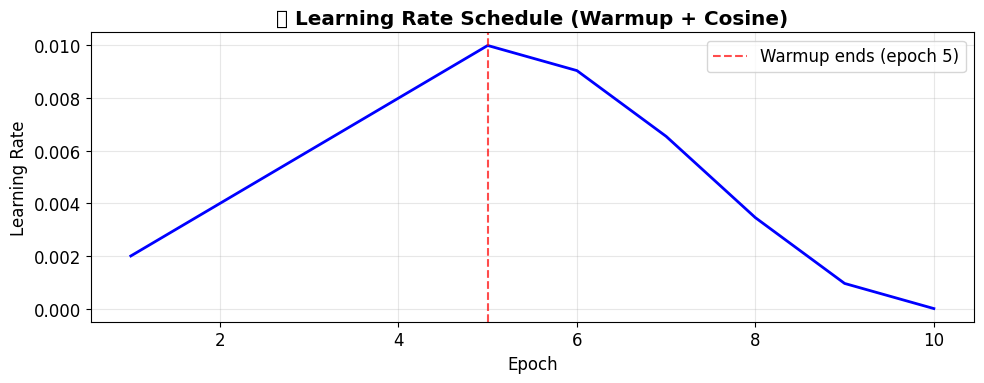

✅ Loss: CrossEntropyLoss (label_smoothing=0.1)
✅ Optimizer: SGD (lr=0.01, momentum=0.9, nesterov=True)
✅ Scheduler: Warmup(5ep) + CosineAnnealing


In [49]:
# ============================================================
# CELL 7: LOSS FUNCTION, OPTIMIZER, SCHEDULER
# ============================================================

# Loss: CrossEntropy với Label Smoothing
criterion = nn.CrossEntropyLoss(label_smoothing=CONFIG['label_smoothing'])

# Optimizer: SGD + Nesterov Momentum
optimizer = optim.SGD(
    model.parameters(),
    lr=CONFIG['lr'],
    momentum=CONFIG['momentum'],
    weight_decay=CONFIG['weight_decay'],
    nesterov=True
)

# Scheduler: Warmup + Cosine Annealing
class WarmupCosineScheduler:
    """Linear Warmup + Cosine Annealing LR Scheduler"""
    def __init__(self, optimizer, warmup_epochs, total_epochs, base_lr, min_lr=1e-6):
        self.optimizer = optimizer
        self.warmup_epochs = warmup_epochs
        self.total_epochs = total_epochs
        self.base_lr = base_lr
        self.min_lr = min_lr
        self.current_epoch = 0

    def step(self):
        self.current_epoch += 1
        if self.current_epoch <= self.warmup_epochs:
            # Linear warmup
            lr = self.base_lr * (self.current_epoch / self.warmup_epochs)
        else:
            # Cosine annealing
            progress = (self.current_epoch - self.warmup_epochs) / (self.total_epochs - self.warmup_epochs)
            lr = self.min_lr + (self.base_lr - self.min_lr) * 0.5 * (1 + math.cos(math.pi * progress))

        for param_group in self.optimizer.param_groups:
            param_group['lr'] = lr

    def get_lr(self):
        return self.optimizer.param_groups[0]['lr']

    def state_dict(self):
        return {'current_epoch': self.current_epoch}

    def load_state_dict(self, state_dict):
        self.current_epoch = state_dict['current_epoch']

scheduler = WarmupCosineScheduler(
    optimizer,
    warmup_epochs=CONFIG['warmup_epochs'],
    total_epochs=CONFIG['epochs'],
    base_lr=CONFIG['lr']
)

# Hiển thị LR schedule
lrs = []
temp_sched = WarmupCosineScheduler(optimizer, CONFIG['warmup_epochs'], CONFIG['epochs'], CONFIG['lr'])
for e in range(CONFIG['epochs']):
    temp_sched.step()
    lrs.append(temp_sched.get_lr())

fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(range(1, CONFIG['epochs']+1), lrs, 'b-', linewidth=2)
ax.axvline(x=CONFIG['warmup_epochs'], color='r', linestyle='--', alpha=0.7, label=f'Warmup ends (epoch {CONFIG["warmup_epochs"]})')
ax.set_xlabel('Epoch')
ax.set_ylabel('Learning Rate')
ax.set_title('📈 Learning Rate Schedule (Warmup + Cosine)', fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Reset scheduler
scheduler = WarmupCosineScheduler(optimizer, CONFIG['warmup_epochs'], CONFIG['epochs'], CONFIG['lr'])

print(f"✅ Loss: CrossEntropyLoss (label_smoothing={CONFIG['label_smoothing']})")
print(f"✅ Optimizer: SGD (lr={CONFIG['lr']}, momentum={CONFIG['momentum']}, nesterov=True)")
print(f"✅ Scheduler: Warmup({CONFIG['warmup_epochs']}ep) + CosineAnnealing")

In [50]:
# ============================================================
# CELL 8: TRAINING LOOP + LOGGING + CHECKPOINT
# ============================================================
from torch.cuda.amp import GradScaler, autocast

def train_one_epoch(model, loader, criterion, optimizer, device, scaler):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        with autocast():
            outputs = model(images)
            loss = criterion(outputs, labels)

        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), CONFIG['grad_clip'])
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * images.size(0)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

    return running_loss / total, 100.0 * correct / total


@torch.no_grad()
def validate(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)
        with autocast():
            outputs = model(images)
            loss = criterion(outputs, labels)

        running_loss += loss.item() * images.size(0)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

    return running_loss / total, 100.0 * correct / total


def save_checkpoint(state, filepath):
    torch.save(state, filepath)


def load_checkpoint(filepath, model, optimizer, scheduler):
    if os.path.exists(filepath):
        print(f"📂 Loading checkpoint: {filepath}")
        ckpt = torch.load(filepath, map_location=device)
        model.load_state_dict(ckpt['model_state_dict'])
        optimizer.load_state_dict(ckpt['optimizer_state_dict'])
        if 'scheduler_state_dict' in ckpt:
            scheduler.load_state_dict(ckpt['scheduler_state_dict'])
        return ckpt.get('epoch', 0), ckpt.get('best_val_acc', 0), ckpt.get('training_log', None)
    return 0, 0, None


# ====== TRAINING ======
training_log = {
    'epoch': [], 'train_loss': [], 'train_acc': [],
    'val_loss': [], 'val_acc': [], 'lr': [], 'epoch_time': []
}

# Resume hoặc train mới
if not CONFIG['resume']:
    import shutil
    if os.path.exists(CONFIG['checkpoint_dir']):
        shutil.rmtree(CONFIG['checkpoint_dir'])
        os.makedirs(CONFIG['checkpoint_dir'], exist_ok=True)
    if os.path.exists(CONFIG['log_dir']):
        shutil.rmtree(CONFIG['log_dir'])
        os.makedirs(CONFIG['log_dir'], exist_ok=True)
    print('🗑️ Đã xóa checkpoint + logs cũ!')

start_epoch = 0
best_val_acc = 0
patience_counter = 0
latest_ckpt = os.path.join(CONFIG['checkpoint_dir'], 'checkpoint_latest.pth')

if CONFIG['resume'] and os.path.exists(latest_ckpt):
    start_epoch, best_val_acc, saved_log = load_checkpoint(latest_ckpt, model, optimizer, scheduler)
    if saved_log:
        training_log = saved_log
    print(f"✅ Resumed from epoch {start_epoch}, best_val_acc={best_val_acc:.2f}%")
else:
    print("🆕 Bắt đầu training mới...")

scaler = GradScaler()

print(f"\n{'='*80}")
print(f"{'TRAINING MOBILENETV2 - CUSTOM TRAFFIC SIGN DATA':^80}")
print(f"{'='*80}")
print(f"{'Epoch':>6} | {'Train Loss':>10} | {'Train Acc':>10} | {'Val Loss':>10} | {'Val Acc':>10} | {'LR':>10} | {'Time':>8} | {'Status':>10}")
print(f"{'-'*80}")

for epoch in range(start_epoch + 1, CONFIG['epochs'] + 1):
    epoch_start = time.time()

    # Update LR
    scheduler.step()
    current_lr = scheduler.get_lr()

    # Train & Validate
    train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer, device, scaler)
    val_loss, val_acc = validate(model, val_loader, criterion, device)

    epoch_time = time.time() - epoch_start

    # Log
    training_log['epoch'].append(epoch)
    training_log['train_loss'].append(train_loss)
    training_log['train_acc'].append(train_acc)
    training_log['val_loss'].append(val_loss)
    training_log['val_acc'].append(val_acc)
    training_log['lr'].append(current_lr)
    training_log['epoch_time'].append(epoch_time)

    # Status
    status = ""
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        patience_counter = 0
        status = "⭐ BEST"
        # Save best model
        save_checkpoint({
            'epoch': epoch, 'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'best_val_acc': best_val_acc, 'training_log': training_log,
        }, os.path.join(CONFIG['checkpoint_dir'], 'best_model.pth'))
    else:
        patience_counter += 1
        status = f"⏳ {patience_counter}/{CONFIG['patience']}"

    # Print progress
    print(f"{epoch:>6} | {train_loss:>10.4f} | {train_acc:>9.2f}% | {val_loss:>10.4f} | {val_acc:>9.2f}% | {current_lr:>10.6f} | {epoch_time:>6.1f}s | {status:>10}")

    # Save periodic checkpoint
    if epoch % CONFIG['save_every'] == 0:
        save_checkpoint({
            'epoch': epoch, 'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'best_val_acc': best_val_acc, 'training_log': training_log,
        }, os.path.join(CONFIG['checkpoint_dir'], f'checkpoint_epoch_{epoch}.pth'))
        print(f"       💾 Checkpoint saved: checkpoint_epoch_{epoch}.pth")

    # Save latest checkpoint (mỗi epoch)
    save_checkpoint({
        'epoch': epoch, 'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'best_val_acc': best_val_acc, 'training_log': training_log,
    }, latest_ckpt)

    # Save training log to JSON & CSV
    with open(os.path.join(CONFIG['log_dir'], 'training_log.json'), 'w') as f:
        json.dump(training_log, f, indent=2)

    with open(os.path.join(CONFIG['log_dir'], 'training_history.csv'), 'w', newline='') as f:
        writer = csv.writer(f)
        writer.writerow(['epoch', 'train_loss', 'train_acc', 'val_loss', 'val_acc', 'lr', 'epoch_time'])
        for i in range(len(training_log['epoch'])):
            writer.writerow([training_log[k][i] for k in training_log])

    # Early stopping
    if patience_counter >= CONFIG['patience']:
        print(f"\n⚠️ Early stopping at epoch {epoch} (no improvement for {CONFIG['patience']} epochs)")
        break

print(f"\n{'='*80}")
print(f"🏆 Training hoàn tất! Best Val Accuracy: {best_val_acc:.2f}%")
print(f"💾 Best model: {os.path.join(CONFIG['checkpoint_dir'], 'best_model.pth')}")
total_time = sum(training_log['epoch_time'])
print(f"⏱️ Tổng thời gian: {total_time/60:.1f} phút")

🗑️ Đã xóa checkpoint + logs cũ!
🆕 Bắt đầu training mới...

                TRAINING MOBILENETV2 - CUSTOM TRAFFIC SIGN DATA                 
 Epoch | Train Loss |  Train Acc |   Val Loss |    Val Acc |         LR |     Time |     Status
--------------------------------------------------------------------------------
     1 |     1.4082 |     61.77% |     0.7909 |     95.43% |   0.002000 |  612.2s |     ⭐ BEST
     2 |     0.7574 |     92.87% |     0.5835 |     99.51% |   0.004000 |  631.9s |     ⭐ BEST
     3 |     0.6243 |     97.87% |     0.5513 |     99.84% |   0.006000 |  636.1s |     ⭐ BEST
     4 |     0.5960 |     98.48% |     0.5416 |     99.95% |   0.008000 |  638.9s |     ⭐ BEST
     5 |     0.5832 |     98.76% |     0.5469 |     99.95% |   0.010000 |  630.5s |     ⏳ 1/10
     6 |     0.5629 |     99.20% |     0.5400 |     99.89% |   0.009045 |  615.4s |     ⏳ 2/10
     7 |     0.5529 |     99.38% |     0.5348 |     99.95% |   0.006545 |  611.3s |     ⏳ 3/10


KeyboardInterrupt: 

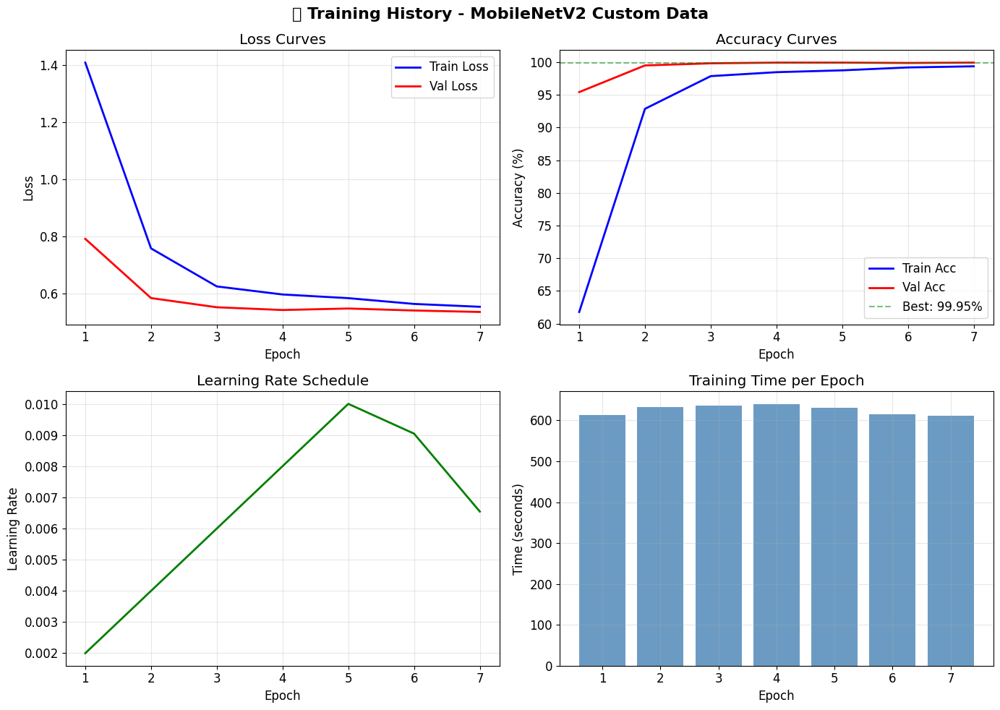

📊 Biểu đồ đã lưu tại: /content/drive/MyDrive/mobilenetv2_gtsrb_v3/logs/training_history.png


In [52]:
# ============================================================
# CELL 9: VISUALIZATION TRAINING HISTORY
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('📊 Training History - MobileNetV2 Custom Data', fontsize=16, fontweight='bold')
epochs_range = training_log['epoch']

# Loss curves
ax = axes[0, 0]
ax.plot(epochs_range, training_log['train_loss'], 'b-', label='Train Loss', linewidth=2)
ax.plot(epochs_range, training_log['val_loss'], 'r-', label='Val Loss', linewidth=2)
ax.set_xlabel('Epoch')
ax.set_ylabel('Loss')
ax.set_title('Loss Curves')
ax.legend()
ax.grid(True, alpha=0.3)

# Accuracy curves
ax = axes[0, 1]
ax.plot(epochs_range, training_log['train_acc'], 'b-', label='Train Acc', linewidth=2)
ax.plot(epochs_range, training_log['val_acc'], 'r-', label='Val Acc', linewidth=2)
ax.axhline(y=best_val_acc, color='g', linestyle='--', alpha=0.5, label=f'Best: {best_val_acc:.2f}%')
ax.set_xlabel('Epoch')
ax.set_ylabel('Accuracy (%)')
ax.set_title('Accuracy Curves')
ax.legend()
ax.grid(True, alpha=0.3)

# Learning rate
ax = axes[1, 0]
ax.plot(epochs_range, training_log['lr'], 'g-', linewidth=2)
ax.set_xlabel('Epoch')
ax.set_ylabel('Learning Rate')
ax.set_title('Learning Rate Schedule')
ax.grid(True, alpha=0.3)

# Epoch time
ax = axes[1, 1]
ax.bar(epochs_range, training_log['epoch_time'], color='steelblue', alpha=0.8)
ax.set_xlabel('Epoch')
ax.set_ylabel('Time (seconds)')
ax.set_title('Training Time per Epoch')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(CONFIG['log_dir'], 'training_history.png'), dpi=150, bbox_inches='tight')
plt.show()
print(f"📊 Biểu đồ đã lưu tại: {CONFIG['log_dir']}training_history.png")

In [53]:
# ============================================================
# CELL 10: ĐÁNH GIÁ TRÊN TEST SET
# ============================================================
from sklearn.metrics import (classification_report, confusion_matrix,
                             precision_score, recall_score, f1_score, accuracy_score)

# Load best model
best_ckpt = os.path.join(CONFIG['checkpoint_dir'], 'best_model.pth')
if os.path.exists(best_ckpt):
    ckpt = torch.load(best_ckpt, map_location=device)
    model.load_state_dict(ckpt['model_state_dict'])
    print(f"✅ Loaded best model (val_acc={ckpt['best_val_acc']:.2f}%)")

# Predict on test set
model.eval()
all_preds = []
all_labels = []
all_probs = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        probs = torch.softmax(outputs, dim=1)
        _, predicted = outputs.max(1)

        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.numpy())
        all_probs.extend(probs.cpu().numpy())

all_preds = np.array(all_preds)
all_labels = np.array(all_labels)
all_probs = np.array(all_probs)

# Metrics
test_acc = accuracy_score(all_labels, all_preds) * 100
test_precision = precision_score(all_labels, all_preds, average='weighted', zero_division=0) * 100
test_recall = recall_score(all_labels, all_preds, average='weighted', zero_division=0) * 100
test_f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0) * 100

print(f"\n{'='*50}")
print(f"{'TEST SET RESULTS':^50}")
print(f"{'='*50}")
print(f"  🎯 Accuracy:  {test_acc:.2f}%")
print(f"  📏 Precision: {test_precision:.2f}%")
print(f"  📐 Recall:    {test_recall:.2f}%")
print(f"  ⚖️ F1-Score:  {test_f1:.2f}%")
print(f"{'='*50}")

# Classification Report
print(f"\n📋 Classification Report:")
print(classification_report(all_labels, all_preds, labels=list(range(NUM_CLASSES)), target_names=CLASS_NAMES, zero_division=0))

✅ Loaded best model (val_acc=99.95%)

                 TEST SET RESULTS                 
  🎯 Accuracy:  99.89%
  📏 Precision: 99.89%
  📐 Recall:    99.89%
  ⚖️ F1-Score:  99.89%

📋 Classification Report:
                precision    recall  f1-score   support

      no_entry       1.00      1.00      1.00       256
   no_stopping       1.00      1.00      1.00       138
   no_vehicles       0.99      0.99      0.99       131
       parking       1.00      1.00      1.00       235
 priority_road       1.00      1.00      1.00       113
     roadworks       1.00      1.00      1.00       156
    roundabout       1.00      1.00      1.00       131
speed_limit_30       1.00      1.00      1.00       147
speed_limit_40       1.00      1.00      1.00       116
speed_limit_50       1.00      1.00      1.00       110
speed_limit_60       1.00      1.00      1.00       111
     stop_sign       1.00      1.00      1.00       191

      accuracy                           1.00      1835
     macro

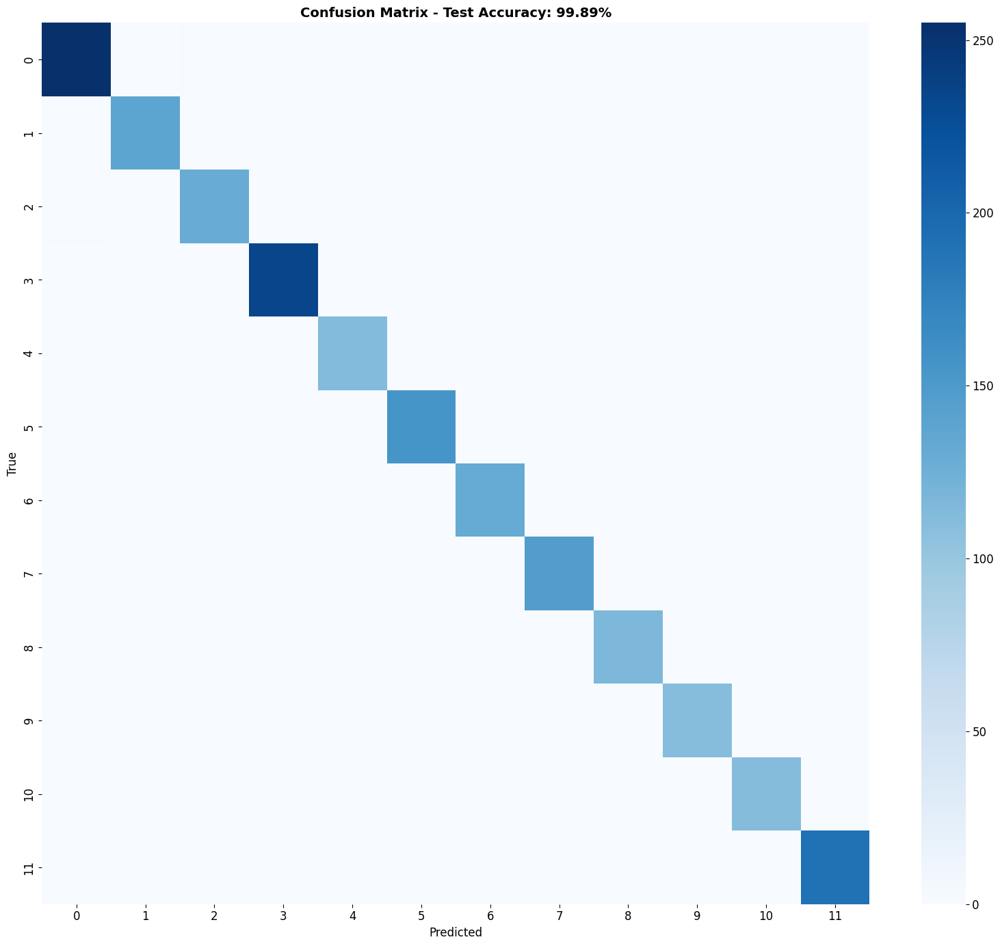

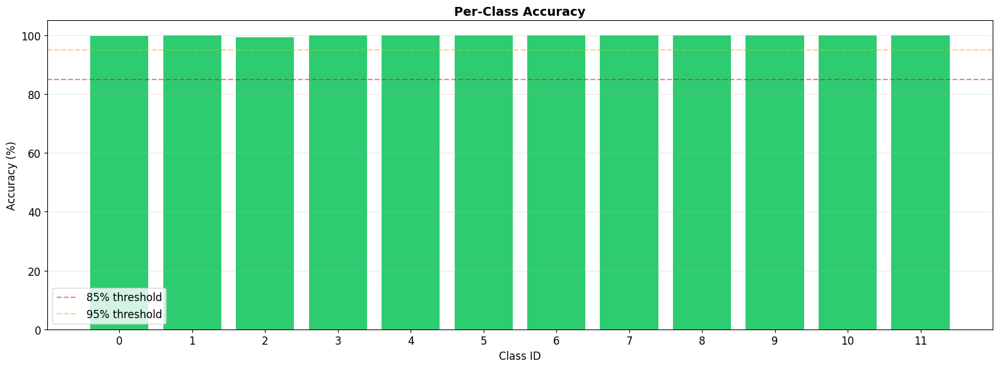


Top-5 best classes:

Top-5 worst classes:
  Class 11 (stop_sign                          ): 100.0%
  Class 10 (speed_limit_60                     ): 100.0%
  Class  9 (speed_limit_50                     ): 100.0%
  Class  8 (speed_limit_40                     ): 100.0%
  Class  7 (speed_limit_30                     ): 100.0%

Top-5 worst classes:
  Class  2 (no_vehicles                        ): 99.2%
  Class  0 (no_entry                           ): 99.6%
  Class  1 (no_stopping                        ): 100.0%
  Class  3 (parking                            ): 100.0%
  Class  4 (priority_road                      ): 100.0%


In [54]:
# ============================================================
# CELL 11: CONFUSION MATRIX & KẾT QUẢ VISUALIZATION
# ============================================================
import seaborn as sns

# 1. Confusion Matrix
cm = confusion_matrix(all_labels, all_preds, labels=list(range(NUM_CLASSES)))
fig, ax = plt.subplots(figsize=(16, 14))
sns.heatmap(cm, annot=False, fmt='d', cmap='Blues', ax=ax,
            xticklabels=range(NUM_CLASSES), yticklabels=range(NUM_CLASSES))
ax.set_xlabel('Predicted', fontsize=12)
ax.set_ylabel('True', fontsize=12)
ax.set_title(f'Confusion Matrix - Test Accuracy: {test_acc:.2f}%', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(CONFIG['log_dir'], 'confusion_matrix.png'), dpi=150, bbox_inches='tight')
plt.show()

# 2. Per-class accuracy
per_class_acc = []
for i in range(NUM_CLASSES):
    mask = all_labels == i
    if mask.sum() > 0:
        acc = (all_preds[mask] == i).sum() / mask.sum() * 100
    else:
        acc = 0
    per_class_acc.append(acc)

fig, ax = plt.subplots(figsize=(16, 6))
colors = ['#e74c3c' if acc < 85 else '#f39c12' if acc < 95 else '#2ecc71' for acc in per_class_acc]
bars = ax.bar(range(NUM_CLASSES), per_class_acc, color=colors)
ax.axhline(y=85, color='r', linestyle='--', alpha=0.5, label='85% threshold')
ax.axhline(y=95, color='orange', linestyle='--', alpha=0.5, label='95% threshold')
ax.set_xlabel('Class ID')
ax.set_ylabel('Accuracy (%)')
ax.set_title('Per-Class Accuracy', fontsize=14, fontweight='bold')
ax.set_xticks(range(NUM_CLASSES))
plt.xticks(rotation=90 if NUM_CLASSES > 20 else 0)
ax.legend()
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.savefig(os.path.join(CONFIG['log_dir'], 'per_class_accuracy.png'), dpi=150, bbox_inches='tight')
plt.show()

print("\nTop-5 best classes:")
sorted_acc = sorted(enumerate(per_class_acc), key=lambda x: x[1])
print("\nTop-5 worst classes:")
for idx, acc in sorted_acc[-5:][::-1]:
    print(f"  Class {idx:2d} ({CLASS_NAMES[idx]:35s}): {acc:.1f}%")
print("\nTop-5 worst classes:")
for idx, acc in sorted_acc[:5]:
    print(f"  Class {idx:2d} ({CLASS_NAMES[idx]:35s}): {acc:.1f}%")

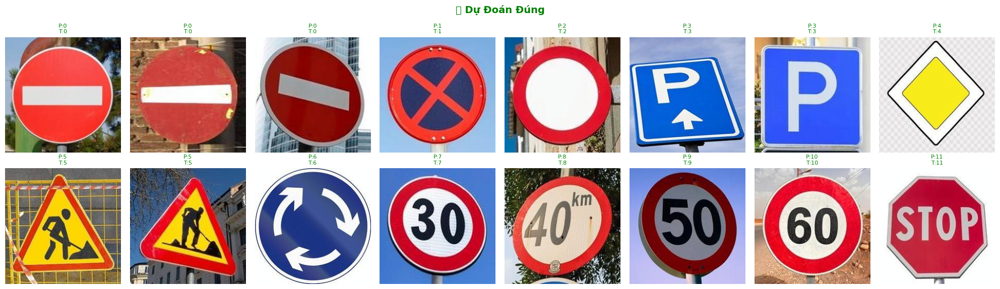

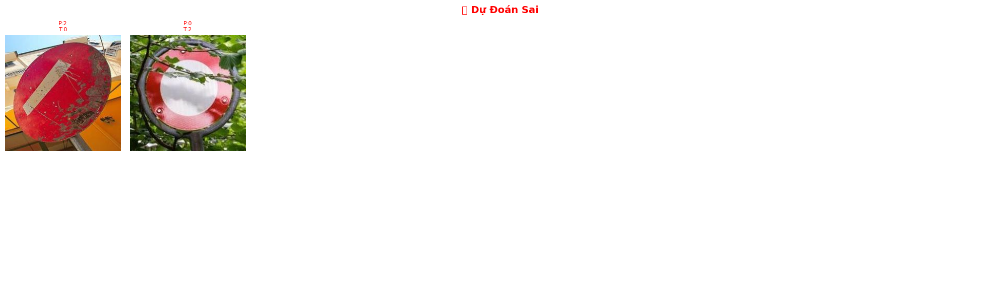


📊 Tổng kết:
  Đúng: 1833/1835 (99.9%)
  Sai:  2/1835 (0.1%)


In [55]:
# ============================================================
# CELL 12: SAMPLE PREDICTIONS
# ============================================================
# Hiển thị dự đoán đúng và sai
correct_indices = np.where(all_preds == all_labels)[0]
wrong_indices = np.where(all_preds != all_labels)[0]

fig, axes = plt.subplots(2, 8, figsize=(20, 6))
fig.suptitle('✅ Dự Đoán Đúng', fontsize=14, fontweight='bold', color='green')
for i, ax in enumerate(axes.flat):
    if i < len(correct_indices):
        idx = correct_indices[i * (len(correct_indices) // 16)]
        img, _ = test_dataset[idx]
        img = inv_normalize(img).permute(1, 2, 0).clamp(0, 1)
        ax.imshow(img)
        ax.set_title(f'P:{all_preds[idx]}\nT:{all_labels[idx]}', fontsize=8, color='green')
    ax.axis('off')
plt.tight_layout()
plt.savefig(os.path.join(CONFIG['log_dir'], 'correct_predictions.png'), dpi=150, bbox_inches='tight')
plt.show()

if len(wrong_indices) > 0:
    fig, axes = plt.subplots(2, 8, figsize=(20, 6))
    fig.suptitle('❌ Dự Đoán Sai', fontsize=14, fontweight='bold', color='red')
    for i, ax in enumerate(axes.flat):
        if i < len(wrong_indices):
            idx = wrong_indices[i % len(wrong_indices)]
            img, _ = test_dataset[idx]
            img = inv_normalize(img).permute(1, 2, 0).clamp(0, 1)
            ax.imshow(img)
            ax.set_title(f'P:{all_preds[idx]}\nT:{all_labels[idx]}', fontsize=8, color='red')
        ax.axis('off')
    plt.tight_layout()
    plt.savefig(os.path.join(CONFIG['log_dir'], 'wrong_predictions.png'), dpi=150, bbox_inches='tight')
    plt.show()

print(f"\n📊 Tổng kết:")
print(f"  Đúng: {len(correct_indices)}/{len(all_labels)} ({len(correct_indices)/len(all_labels)*100:.1f}%)")
print(f"  Sai:  {len(wrong_indices)}/{len(all_labels)} ({len(wrong_indices)/len(all_labels)*100:.1f}%)")

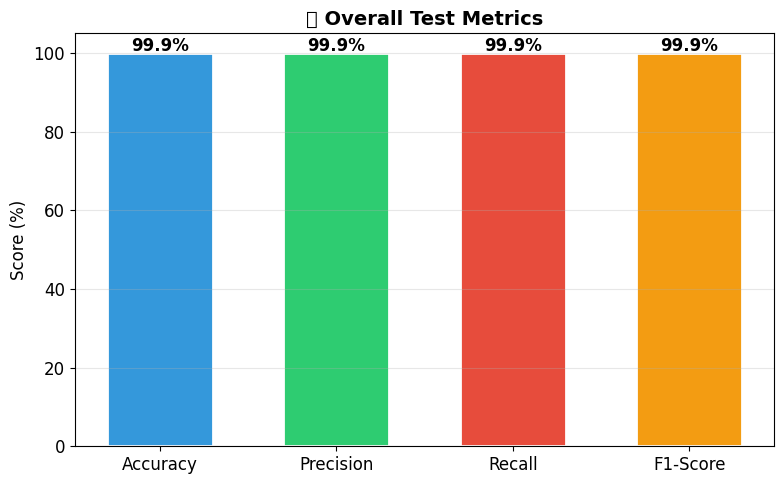

In [56]:
# ============================================================
# CELL 13: BIỂU ĐỒ TỔNG HỢP METRICS
# ============================================================
# Bar chart cho Overall Metrics
fig, ax = plt.subplots(figsize=(8, 5))
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
values = [test_acc, test_precision, test_recall, test_f1]
colors = ['#3498db', '#2ecc71', '#e74c3c', '#f39c12']
bars = ax.bar(metrics, values, color=colors, width=0.6, edgecolor='white', linewidth=2)
for bar, val in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
            f'{val:.1f}%', ha='center', fontsize=12, fontweight='bold')
ax.set_ylim(0, 105)
ax.set_ylabel('Score (%)')
ax.set_title('📊 Overall Test Metrics', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.savefig(os.path.join(CONFIG['log_dir'], 'overall_metrics.png'), dpi=150, bbox_inches='tight')
plt.show()

In [57]:
# ============================================================
# CELL 14: MODEL ANALYSIS & EXPORT
# ============================================================
print("=" * 60)
print(f"{'MODEL ANALYSIS':^60}")
print("=" * 60)

# Parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
model_size_mb = total_params * 4 / 1024 / 1024

print(f"\n📊 Parameter Count:")
print(f"  Total:     {total_params:>12,}")
print(f"  Trainable: {trainable_params:>12,}")
print(f"  Model size: {model_size_mb:.1f} MB (FP32)")

# Per-layer params
print(f"\n📋 Parameters per Layer:")
for name, module in model.named_children():
    params = sum(p.numel() for p in module.parameters())
    print(f"  {name:20s}: {params:>10,} params")

# Save final model
final_path = os.path.join(CONFIG['checkpoint_dir'], 'mobilenetv2_gtsrb_final.pth')
torch.save({
    'model_state_dict': model.state_dict(),
    'config': CONFIG,
    'test_accuracy': test_acc,
    'test_f1': test_f1,
    'class_names': CLASS_NAMES,
    'num_classes': CONFIG['num_classes'],
}, final_path)
print(f"\n💾 Final model saved: {final_path}")
print(f"   File size: {os.path.getsize(final_path) / 1024 / 1024:.1f} MB")

# Checkpoint files summary
print(f"\n📁 Checkpoint files:")
for f in sorted(os.listdir(CONFIG['checkpoint_dir'])):
    fp = os.path.join(CONFIG['checkpoint_dir'], f)
    print(f"  {f:40s} ({os.path.getsize(fp)/1024/1024:.1f} MB)")

print(f"\n{'='*60}")
print(f"🎉 HOÀN TẤT! MobileNetV2 đã được train và đánh giá.")
print(f"   Test Accuracy: {test_acc:.2f}%")
print(f"   Test F1-Score: {test_f1:.2f}%")
print(f"   Model lưu tại: {CONFIG['checkpoint_dir']}")
print(f"   Logs lưu tại:  {CONFIG['log_dir']}")
print(f"{'='*60}")

                       MODEL ANALYSIS                       

📊 Parameter Count:
  Total:        2,239,244
  Trainable:    2,239,244
  Model size: 8.5 MB (FP32)

📋 Parameters per Layer:
  features            :  2,223,872 params
  classifier          :     15,372 params

💾 Final model saved: /content/drive/MyDrive/mobilenetv2_gtsrb_v3/checkpoints/mobilenetv2_gtsrb_final.pth
   File size: 8.8 MB

📁 Checkpoint files:
  best_model.pth                           (17.4 MB)
  checkpoint_latest.pth                    (17.4 MB)
  mobilenetv2_gtsrb_final.pth              (8.8 MB)

🎉 HOÀN TẤT! MobileNetV2 đã được train và đánh giá.
   Test Accuracy: 99.89%
   Test F1-Score: 99.89%
   Model lưu tại: /content/drive/MyDrive/mobilenetv2_gtsrb_v3/checkpoints/
   Logs lưu tại:  /content/drive/MyDrive/mobilenetv2_gtsrb_v3/logs/


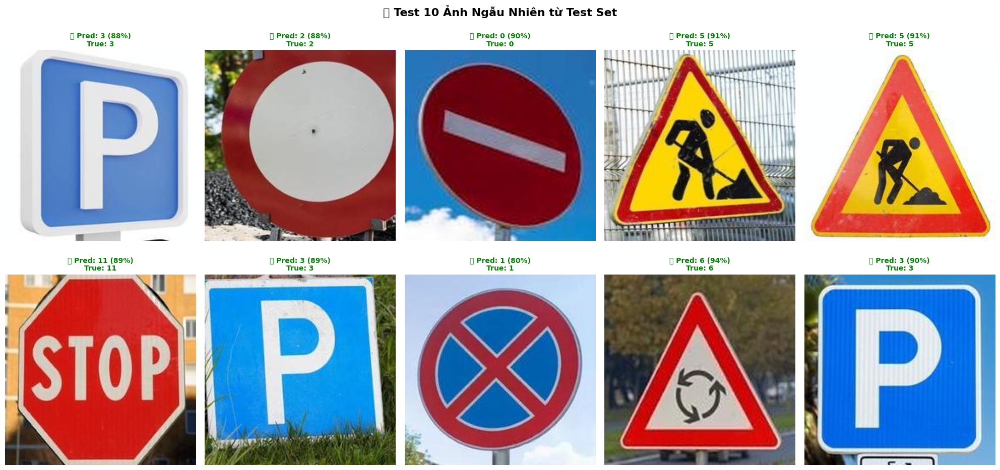


📊 Kết quả: 10/10 đúng (100%)

Chi tiết:
  ✅ Ảnh 1: True=parking                             | Pred=parking                             | Conf=87.9%
  ✅ Ảnh 2: True=no_vehicles                         | Pred=no_vehicles                         | Conf=88.4%
  ✅ Ảnh 3: True=no_entry                            | Pred=no_entry                            | Conf=90.1%
  ✅ Ảnh 4: True=roadworks                           | Pred=roadworks                           | Conf=91.4%
  ✅ Ảnh 5: True=roadworks                           | Pred=roadworks                           | Conf=90.8%
  ✅ Ảnh 6: True=stop_sign                           | Pred=stop_sign                           | Conf=88.9%
  ✅ Ảnh 7: True=parking                             | Pred=parking                             | Conf=89.4%
  ✅ Ảnh 8: True=no_stopping                         | Pred=no_stopping                         | Conf=80.2%
  ✅ Ảnh 9: True=roundabout                          | Pred=roundabout                          

In [58]:
# ============================================================
# CELL: TEST 10 ẢNH NGẪU NHIÊN TỪ TEST SET
# ============================================================
import random

# Lấy 10 ảnh ngẫu nhiên từ test set
random.seed(None)  # Random thật sự
test_indices = random.sample(range(len(test_dataset)), 10)

fig, axes = plt.subplots(2, 5, figsize=(20, 10))
fig.suptitle('🧪 Test 10 Ảnh Ngẫu Nhiên từ Test Set', fontsize=16, fontweight='bold')

correct_count = 0

for i, (ax, idx) in enumerate(zip(axes.flat, test_indices)):
    img, true_label = test_dataset[idx]

    # Predict
    model.eval()
    with torch.no_grad():
        output = model(img.unsqueeze(0).to(device))
        probs = torch.softmax(output, dim=1)
        confidence, pred_label = probs.max(1)
        pred_label = pred_label.item()
        confidence = confidence.item() * 100

    # Hiển thị ảnh
    img_show = inv_normalize(img).permute(1, 2, 0).clamp(0, 1)
    ax.imshow(img_show)

    is_correct = pred_label == true_label
    if is_correct:
        correct_count += 1
        color = 'green'
        symbol = '✅'
    else:
        color = 'red'
        symbol = '❌'

    ax.set_title(f'{symbol} Pred: {pred_label} ({confidence:.0f}%)\nTrue: {true_label}',
                 fontsize=10, color=color, fontweight='bold')
    ax.axis('off')

plt.tight_layout()
plt.savefig(os.path.join(CONFIG['log_dir'], 'random_test_10.png'), dpi=150, bbox_inches='tight')
plt.show()

print(f"\n📊 Kết quả: {correct_count}/10 đúng ({correct_count*10}%)")
print(f"\nChi tiết:")
for i, idx in enumerate(test_indices):
    _, true_label = test_dataset[idx]
    img, _ = test_dataset[idx]
    with torch.no_grad():
        output = model(img.unsqueeze(0).to(device))
        probs = torch.softmax(output, dim=1)
        conf, pred = probs.max(1)
    status = '✅' if pred.item() == true_label else '❌'
    print(f"  {status} Ảnh {i+1}: True={CLASS_NAMES[true_label]:35s} | Pred={CLASS_NAMES[pred.item()]:35s} | Conf={conf.item()*100:.1f}%")

📁 Upload ảnh biển báo:


Saving nostop_1.png to nostop_1 (8).png

📷 nostop_1 (8).png — kéo chuột chọn vùng crop hoặc bấm OK:
📐 Crop: [840, 60, 1650, 890]


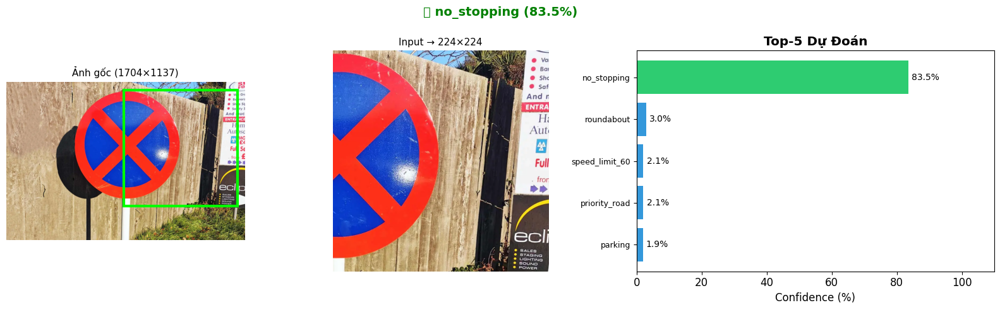

✅ no_stopping (83.5%)


In [67]:
# ============================================================
# CELL 15: DỰ ĐOÁN ẢNH TỪ BÊN NGOÀI (KÉO CHUỘT CROP)
# ============================================================
from google.colab import files, output
from IPython.display import display, HTML
import base64, io

def get_crop_from_js(img_path):
    """Hiển thị ảnh, cho user kéo chuột chọn vùng crop, trả về tọa độ."""
    img_pil = Image.open(img_path).convert('RGB')
    w, h = img_pil.size

    # Scale ảnh để hiển thị vừa màn hình
    max_display = 700
    scale = min(max_display / w, max_display / h, 1.0)
    dw, dh = int(w * scale), int(h * scale)

    # Convert ảnh sang base64
    buf = io.BytesIO()
    img_pil.resize((dw, dh)).save(buf, format='PNG')
    b64 = base64.b64encode(buf.getvalue()).decode()

    js_code = f"""
    (async () => {{
        const img = new window.Image();
        img.src = 'data:image/png;base64,{b64}';
        await new Promise(r => img.onload = r);

        const canvas = document.createElement('canvas');
        canvas.width = {dw}; canvas.height = {dh};
        canvas.style.cursor = 'crosshair';
        canvas.style.border = '2px solid #333';
        canvas.style.borderRadius = '8px';

        const ctx = canvas.getContext('2d');
        ctx.drawImage(img, 0, 0);

        const info = document.createElement('div');
        info.style.cssText = 'font:14px monospace;margin:8px 0;color:#555';
        info.textContent = '🖱️ Kéo chuột chọn vùng biển báo, hoặc bấm OK để dùng toàn bộ ảnh';

        const btnRow = document.createElement('div');
        btnRow.style.cssText = 'margin:8px 0;display:flex;gap:10px';

        const btnOK = document.createElement('button');
        btnOK.textContent = '✅ OK - Dự đoán';
        btnOK.style.cssText = 'padding:8px 24px;font-size:15px;background:#2ecc71;color:#fff;border:none;border-radius:6px;cursor:pointer';

        const btnReset = document.createElement('button');
        btnReset.textContent = '🔄 Vẽ lại';
        btnReset.style.cssText = 'padding:8px 24px;font-size:15px;background:#3498db;color:#fff;border:none;border-radius:6px;cursor:pointer';

        btnRow.appendChild(btnOK);
        btnRow.appendChild(btnReset);

        const container = document.createElement('div');
        container.appendChild(info);
        container.appendChild(canvas);
        container.appendChild(btnRow);
        document.querySelector('#output-area').appendChild(container);

        let startX=0, startY=0, drawing=false, hasRect=false;
        let rx=0, ry=0, rw=0, rh=0;

        function redraw() {{
            ctx.drawImage(img, 0, 0);
            if (hasRect) {{
                ctx.strokeStyle = '#00ff00';
                ctx.lineWidth = 3;
                ctx.setLineDash([]);
                ctx.strokeRect(rx, ry, rw, rh);
                ctx.fillStyle = 'rgba(0,255,0,0.1)';
                ctx.fillRect(rx, ry, rw, rh);
                info.textContent = '✅ Đã chọn vùng ' + Math.round(rx/{scale}) + ',' + Math.round(ry/{scale}) + ' → ' + Math.round((rx+rw)/{scale}) + ',' + Math.round((ry+rh)/{scale}) + ' | Bấm OK để dự đoán';
            }}
        }}

        canvas.onmousedown = e => {{
            const rect = canvas.getBoundingClientRect();
            startX = e.clientX - rect.left;
            startY = e.clientY - rect.top;
            drawing = true; hasRect = false;
        }};
        canvas.onmousemove = e => {{
            if (!drawing) return;
            const rect = canvas.getBoundingClientRect();
            const mx = e.clientX - rect.left;
            const my = e.clientY - rect.top;
            rx = Math.min(startX, mx); ry = Math.min(startY, my);
            rw = Math.abs(mx - startX); rh = Math.abs(my - startY);
            hasRect = true;
            redraw();
        }};
        canvas.onmouseup = () => {{ drawing = false; }};

        btnReset.onclick = () => {{
            hasRect = false; redraw();
            info.textContent = '🖱️ Kéo chuột chọn vùng biển báo, hoặc bấm OK để dùng toàn bộ ảnh';
        }};

        const result = await new Promise(resolve => {{
            btnOK.onclick = () => {{
                container.remove();
                if (hasRect && rw > 5 && rh > 5) {{
                    resolve([
                        Math.round(rx / {scale}),
                        Math.round(ry / {scale}),
                        Math.round((rx + rw) / {scale}),
                        Math.round((ry + rh) / {scale})
                    ]);
                }} else {{
                    resolve(null);
                }}
            }};
        }});
        return result;
    }})()
    """
    crop = output.eval_js(js_code)
    return crop

def predict_and_show(img_path, crop_box=None):
    img_pil = Image.open(img_path).convert('RGB')
    img_input = img_pil.crop(crop_box) if crop_box else img_pil

    predict_tf = transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.ToTensor(),
        transforms.Normalize(MEAN, STD),
    ])
    tensor = predict_tf(img_input).unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        out = model(tensor)
        probs = torch.softmax(out, dim=1)
        top_p, top_i = probs.topk(5, dim=1)

    top_p = top_p[0].cpu().numpy() * 100
    top_i = top_i[0].cpu().numpy()

    fig, axes = plt.subplots(1, 3, figsize=(16, 5),
                              gridspec_kw={'width_ratios': [1, 1, 1.5]})
    axes[0].imshow(img_pil)
    if crop_box:
        import matplotlib.patches as patches
        l,t,r,b = crop_box
        rect = patches.Rectangle((l,t), r-l, b-t, linewidth=3, edgecolor='lime', facecolor='none')
        axes[0].add_patch(rect)
    axes[0].set_title(f'Ảnh gốc ({img_pil.size[0]}×{img_pil.size[1]})', fontsize=11)
    axes[0].axis('off')

    axes[1].imshow(img_input)
    axes[1].set_title(f'Input → {IMG_SIZE}×{IMG_SIZE}', fontsize=11)
    axes[1].axis('off')

    colors = ['#2ecc71' if j==0 else '#3498db' for j in range(5)]
    axes[2].barh(range(4,-1,-1), top_p, color=colors)
    axes[2].set_yticks(range(4,-1,-1))
    axes[2].set_yticklabels([CLASS_NAMES[j] for j in top_i], fontsize=9)
    axes[2].set_xlabel('Confidence (%)')
    axes[2].set_title('Top-5 Dự Đoán', fontweight='bold')
    axes[2].set_xlim(0, 110)
    for idx, p in enumerate(top_p):
        axes[2].text(p+1, 4-idx, f'{p:.1f}%', va='center', fontsize=10)

    plt.suptitle(f'🚦 {CLASS_NAMES[top_i[0]]} ({top_p[0]:.1f}%)',
                 fontsize=14, fontweight='bold', color='green')
    plt.tight_layout()
    plt.show()
    print(f"✅ {CLASS_NAMES[top_i[0]]} ({top_p[0]:.1f}%)")

# ====== CHẠY ======
print("📁 Upload ảnh biển báo:")
uploaded = files.upload()
for fname in uploaded:
    fpath = f'/content/{fname}'
    with open(fpath, 'wb') as f:
        f.write(uploaded[fname])
    print(f"\n📷 {fname} — kéo chuột chọn vùng crop hoặc bấm OK:")
    crop = get_crop_from_js(fpath)
    if crop:
        print(f"📐 Crop: {crop}")
    else:
        print("📐 Không crop — dùng toàn bộ ảnh")
    predict_and_show(fpath, crop)

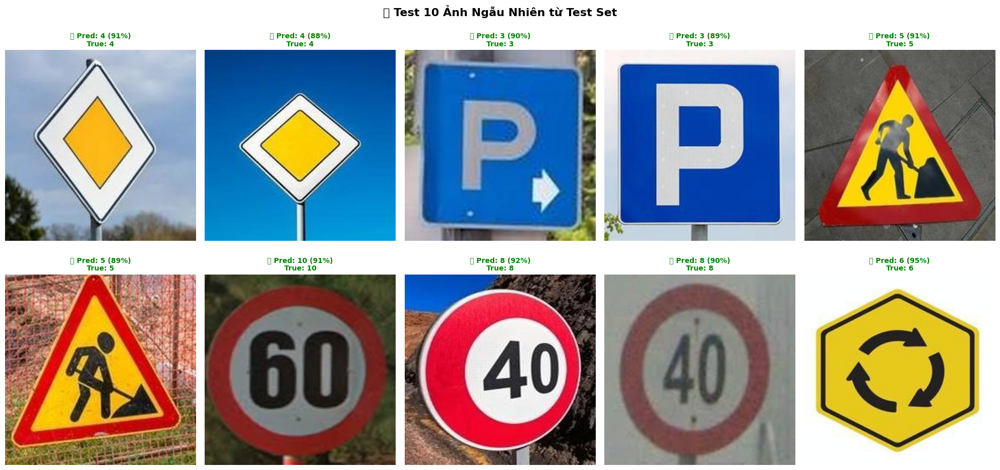


📊 Kết quả: 10/10 đúng (100%)
  ✅ Ảnh 1: True=priority_road                       | Pred=priority_road                       | Conf=90.7%
  ✅ Ảnh 2: True=priority_road                       | Pred=priority_road                       | Conf=88.0%
  ✅ Ảnh 3: True=parking                             | Pred=parking                             | Conf=90.0%
  ✅ Ảnh 4: True=parking                             | Pred=parking                             | Conf=88.8%
  ✅ Ảnh 5: True=roadworks                           | Pred=roadworks                           | Conf=91.5%
  ✅ Ảnh 6: True=roadworks                           | Pred=roadworks                           | Conf=88.8%
  ✅ Ảnh 7: True=speed_limit_60                      | Pred=speed_limit_60                      | Conf=91.5%
  ✅ Ảnh 8: True=speed_limit_40                      | Pred=speed_limit_40                      | Conf=91.7%
  ✅ Ảnh 9: True=speed_limit_40                      | Pred=speed_limit_40                      | Conf=90.1

In [60]:
# ============================================================
# CELL: TEST 10 ẢNH NGẪU NHIÊN TỪ TEST SET
# ============================================================
import random

random.seed(None)
test_indices = random.sample(range(len(test_dataset)), 10)

fig, axes = plt.subplots(2, 5, figsize=(20, 10))
fig.suptitle('🧪 Test 10 Ảnh Ngẫu Nhiên từ Test Set', fontsize=16, fontweight='bold')

correct_count = 0

for i, (ax, idx) in enumerate(zip(axes.flat, test_indices)):
    img, true_label = test_dataset[idx]
    model.eval()
    with torch.no_grad():
        output = model(img.unsqueeze(0).to(device))
        probs = torch.softmax(output, dim=1)
        confidence, pred_label = probs.max(1)
        pred_label = pred_label.item()
        confidence = confidence.item() * 100

    img_show = inv_normalize(img).permute(1, 2, 0).clamp(0, 1)
    ax.imshow(img_show)

    is_correct = pred_label == true_label
    if is_correct:
        correct_count += 1
    color = 'green' if is_correct else 'red'
    symbol = '✅' if is_correct else '❌'

    ax.set_title(f'{symbol} Pred: {pred_label} ({confidence:.0f}%)\nTrue: {true_label}',
                 fontsize=10, color=color, fontweight='bold')
    ax.axis('off')

plt.tight_layout()
plt.show()

print(f"\n📊 Kết quả: {correct_count}/10 đúng ({correct_count*10}%)")
for i, idx in enumerate(test_indices):
    _, true_label = test_dataset[idx]
    img, _ = test_dataset[idx]
    with torch.no_grad():
        output = model(img.unsqueeze(0).to(device))
        probs = torch.softmax(output, dim=1)
        conf, pred = probs.max(1)
    status = '✅' if pred.item() == true_label else '❌'
    print(f"  {status} Ảnh {i+1}: True={CLASS_NAMES[true_label]:35s} | Pred={CLASS_NAMES[pred.item()]:35s} | Conf={conf.item()*100:.1f}%")